# Where is Waldo

## unzip data file

In [ ]:
# import zipfile

# zip_file = "/home/fangxy/CU/waldo/wheres-waldo.zip" # replace path to your zip file's path
# extract_dir = "/home/fangxy/CU/waldo/" # where zip file is going to be extracted to

# os.makedirs(extract_dir, exist_ok=True) # create the extraction directory if it doesn't exist

# with zipfile.ZipFile(zip_file, 'r') as zip_ref: # unzip
#     zip_ref.extractall(extract_dir)

# print(f"Files extracted to {extract_dir}")

## import packages

In [ ]:
import os
import cv2
import numpy as np
import random
import xml.etree.ElementTree as ET
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import matplotlib.pyplot as plt

## generate mask from .xml files as labels
(The masks annotates the location of Waldos in each uncropped image and is downloaded from https://github.com/bckenstler/TheresWaldo/blob/master/imgs_boxes.zip)

In [ ]:
def parse_xml(xml_path):
    """
    Parse the XML file and extract all bounding box coordinates.
    Assumes the XML file is in VOC format, where each <object> contains a <bndbox>
    with xmin, ymin, xmax, and ymax.

    Returns:
        boxes: A list where each element is [xmin, ymin, xmax, ymax] (integers).
    """
    if not os.path.exists(xml_path):
        return []
    tree = ET.parse(xml_path)
    root = tree.getroot()
    boxes = []
    for obj in root.findall('object'):
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        boxes.append([xmin, ymin, xmax, ymax])
    return boxes

## create target tensor
(Used for generating input tensors into the network after cropping the images to a fixed size.)

In [ ]:
def create_target_tensor(target_size, boxes, grid_size=(16,16), orig_size=None):
    """
    Convert the target bounding box (assumes only the first target is used)
    into a target tensor.

    Inputs:
      target_size: The target image size (width, height), e.g., (256,256)
      boxes: A list of [xmin, ymin, xmax, ymax] (coordinates relative to the crop region)
      grid_size: The output grid size, e.g., (16,16)
      orig_size: The original (current crop) image size (W, H). If None, defaults to target_size.

    Output:
      target: A tensor of shape [grid_H, grid_W, 5], where:
         The first channel indicates the presence probability of the target (0 or 1),
         and the following 4 channels are [cx, cy, w, h] (normalized coordinates).
    """
    grid_W, grid_H = grid_size  # Note the order: (width, height)
    cell_w = target_size[0] / grid_W
    cell_h = target_size[1] / grid_H
    target = np.zeros((grid_H, grid_W, 5), dtype=np.float32)

    if len(boxes) == 0:
        return target

    # Use the first target box
    xmin, ymin, xmax, ymax = boxes[0]
    if orig_size is not None:
        orig_W, orig_H = orig_size
    else:
        orig_W, orig_H = target_size
    # At this point, the box coordinates are already relative to the crop region (e.g., 256x256), so no scaling is required.
    box_cx = (xmin + xmax) / 2.0
    box_cy = (ymin + ymax) / 2.0
    box_w = xmax - xmin
    box_h = ymax - ymin

    cell_x = int(box_cx / cell_w)
    cell_y = int(box_cy / cell_h)
    cell_x = min(max(cell_x, 0), grid_W - 1)
    cell_y = min(max(cell_y, 0), grid_H - 1)

    local_cx = (box_cx - cell_x * cell_w) / cell_w
    local_cy = (box_cy - cell_y * cell_h) / cell_h
    local_w = box_w / target_size[0]
    local_h = box_h / target_size[1]

    target[cell_y, cell_x, 0] = 1.0
    target[cell_y, cell_x, 1:] = np.array([local_cx, local_cy, local_w, local_h], dtype=np.float32)
    return target


## dataset
(For original images with correctly labeled Waldo positions, we crop a 256×256 patch centered on the middle of the Waldo box. Additionally, we randomly select some 256×256 cropped images that do not contain Waldo.)

In [ ]:
class WaldoDetectionDataset(Dataset):
    def __init__(self, img_dir, xml_dir, target_size=(256,256), grid_size=(16,16), transform=None):
        """
        img_dir: Directory containing the original images (e.g., 1.jpg, 2.jpg, ..., 19.jpg)
        xml_dir: Directory containing the corresponding XML annotations (e.g., 1.xml, 2.xml, ..., 19.xml)
        target_size: The output patch size (e.g., (256,256))
        grid_size: The grid size for the output, e.g., (16,16)
        transform: Optional data augmentation

        Returns:
          Each sample is a tuple (img_tensor, target_tensor)
          The target_tensor shape is [5, grid_H, grid_W]

        For each image:
          - If there is at least one target in the XML, extract a 256×256 patch centered on each target (with boundary adjustment).
          - If there is no target, return one sample with the entire image resized to target_size.
        """
        self.img_dir = img_dir
        self.xml_dir = xml_dir
        self.target_size = target_size  # e.g., (256,256)
        self.grid_size = grid_size      # e.g., (16,16)
        self.transform = transform
        self.samples = []  # Each element is a tuple (img_path, xml_path, crop_x, crop_y) for each target, or (img_path, xml_path, None, None) if no target

        img_files = sorted([f for f in os.listdir(img_dir)
                            if f.lower().endswith(('.jpg','.png','.jpeg'))],
                           key=lambda x: int(os.path.splitext(x)[0]))

        for img_name in img_files:
            img_path = os.path.join(img_dir, img_name)
            xml_path = os.path.join(xml_dir, os.path.splitext(img_name)[0] + ".xml")
            # Read the image to get its size
            img = cv2.imread(img_path)
            if img is None:
                continue
            H, W = img.shape[:2]
            boxes = parse_xml(xml_path)
            if len(boxes) == 0:
                # For images without any target, add one sample with crop coordinates as None
                self.samples.append((img_path, xml_path, None, None))
            else:
                # For each target box, compute crop coordinates for a patch of target_size centered on the box center.
                patch_w, patch_h = self.target_size
                half_w, half_h = patch_w // 2, patch_h // 2
                for box in boxes:
                    xmin, ymin, xmax, ymax = box
                    cx = (xmin + xmax) // 2
                    cy = (ymin + ymax) // 2
                    crop_x = cx - half_w
                    crop_y = cy - half_h
                    # Adjust boundaries
                    if crop_x < 0:
                        crop_x = 0
                    if crop_y < 0:
                        crop_y = 0
                    if crop_x + patch_w > W:
                        crop_x = W - patch_w
                    if crop_y + patch_h > H:
                        crop_y = H - patch_h
                    self.samples.append((img_path, xml_path, crop_x, crop_y))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, xml_path, crop_x, crop_y = self.samples[idx]
        # Load the image and convert to RGB
        img = cv2.imread(img_path)
        if img is None:
            raise ValueError(f"Cannot read image: {img_path}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]
        patch_w, patch_h = self.target_size

        if crop_x is None or crop_y is None:
            # For images without a target, resize the entire image to target_size
            patch = cv2.resize(img, self.target_size, interpolation=cv2.INTER_LINEAR)
            boxes = []  # No boxes
        else:
            patch = img[crop_y:crop_y+patch_h, crop_x:crop_x+patch_w]
            # Update boxes: convert coordinates to be relative to the cropped patch
            boxes = parse_xml(xml_path)
            boxes = [[box[0] - crop_x, box[1] - crop_y, box[2] - crop_x, box[3] - crop_y] for box in boxes]
            for i in range(len(boxes)):
                boxes[i][0] = max(boxes[i][0], 0)
                boxes[i][1] = max(boxes[i][1], 0)
                boxes[i][2] = min(boxes[i][2], patch_w)
                boxes[i][3] = min(boxes[i][3], patch_h)

        patch = patch.astype(np.float32) / 255.0
        if self.transform:
            patch = self.transform(patch)
        patch = np.transpose(patch, (2, 0, 1))
        img_tensor = torch.from_numpy(patch)

        # Generate target tensor based on the boxes (coordinates are relative to the patch)
        target_np = create_target_tensor(
            target_size=self.target_size,
            boxes=boxes,
            grid_size=self.grid_size,
            orig_size=self.target_size  # already 256x256
        )
        target_tensor = torch.from_numpy(target_np).permute(2, 0, 1)  # [5, grid_H, grid_W]
        return img_tensor, target_tensor


## detector model
(The model is a simple convolutional detector designed to predict object presence and localization in a fixed-size image (256×256). It produces an output tensor of shape [B, 5, 32, 32], where the five channels represent [objectness, center x, center y, width, height].)

In [ ]:
class SimpleDetector(nn.Module):
    def __init__(self, in_channels=3, grid_size=(32,32), num_outputs=5):
        """
        The network takes a fixed-size image (e.g., 256×256) as input and outputs a tensor of shape [B, num_outputs, grid_H, grid_W].
        Here, num_outputs=5 corresponds to [objectness, cx, cy, w, h].
        In this case, grid_size is set to (32,32), meaning each cell covers 8×8 pixels,
        which is more suitable for localizing small targets (Waldo) that are about 12–13 pixels after rescaling.
        """
        super(SimpleDetector, self).__init__()
        self.grid_size = grid_size
        self.features = nn.Sequential(
            nn.Conv2d(in_channels, 32, 3, padding=1),   # Output: 256×256
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),                             # 256 → 128
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),                             # 128 → 64
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
            # Do not apply a third pooling layer so that the feature map remains at 64×64
        )
        # Downsample the 64×64 feature map to 32×32 using a convolution with stride 2
        self.conv_mapping = nn.Sequential(
            nn.Conv2d(128, 256, 3, stride=2, padding=1),  # 64 → 32
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        # The final 1×1 convolution maps to 5 output channels
        self.pred = nn.Conv2d(256, num_outputs, 1)

    def forward(self, x):
        x = self.features(x)       # [B,128,64,64]
        x = self.conv_mapping(x)   # [B,256,32,32]
        x = self.pred(x)           # [B,5,32,32]
        x = torch.sigmoid(x)
        return x

## loss function
(The loss function computes the detection loss for each grid cell. It integrates a Coordinate Regression Loss and a Objectness Loss Using Focal Loss where positive samples are given a higher weight (alpha = 0.8) since they're harder to detect while negatives are given lower weight (alpha = 0.2). The overall loss is a weighted sum of the coordinate regression loss (scaled by lambda_coord) and the objectness losses, normalized by the batch size.)

In [ ]:
def focal_loss(pred, target, alpha=0.25, gamma=2.0):
    """
    Compute the focal loss for binary classification.

    Inputs:
      pred: predicted probabilities (tensor)
      target: ground truth (tensor), 0 or 1
      alpha: balancing factor
      gamma: focusing parameter

    Returns:
      loss: summed focal loss over all elements.
    """
    # Clamp predictions to avoid log(0)
    pred = torch.clamp(pred, 1e-8, 1.0 - 1e-8)
    loss = -alpha * (1 - pred) ** gamma * target * torch.log(pred) - \
           (1 - alpha) * pred ** gamma * (1 - target) * torch.log(1 - pred)
    return loss.sum()


def detection_loss_yolo(pred, target, lambda_coord=10.0):
    """
    Compute the detection loss for each grid cell:
      - For grid cells with a target (target[:,0] == 1), compute the coordinate regression loss
        (MSE) and the objectness loss using focal loss (positive samples).
      - For grid cells without a target, compute the objectness loss using focal loss with a lower weight.

    Inputs:
      pred, target: Tensors of shape [B, 5, grid_H, grid_W], where channels represent
                    [objectness, cx, cy, w, h].
    """
    obj_mask = target[:, 0, :, :]      # [B, grid_H, grid_W] indicating target presence
    noobj_mask = 1 - obj_mask          # Mask for cells with no target
    mse_loss = nn.MSELoss(reduction='sum')

    # Compute coordinate regression loss only for grid cells with a target.
    coord_loss = mse_loss(
        pred[:, 1:5, :, :] * obj_mask.unsqueeze(1),
        target[:, 1:5, :, :] * obj_mask.unsqueeze(1)
    )

    # Compute objectness loss using focal loss for positive and negative samples.
    pos_obj_loss = focal_loss(pred[:, 0, :, :] * obj_mask,
                              target[:, 0, :, :] * obj_mask,
                              alpha=0.8, gamma=2.0)
    neg_obj_loss = focal_loss(pred[:, 0, :, :] * noobj_mask,
                              target[:, 0, :, :] * noobj_mask,
                              alpha=0.2, gamma=2.0)

    total_loss = lambda_coord * coord_loss + pos_obj_loss + neg_obj_loss
    total_loss = total_loss / pred.size(0)  # Normalize by the batch size
    return total_loss


## train and validation
(Excluded 5.jpg since it has a wrong position label box, excluded 16.jpg since it has no label box. Thus, we have the original images of 1-19 excluding 5 and 16 as well as a couple of random selected notwaldo images with size 256\*256 under the folder /train and the .xml files of the 1-19 images under the folder /bnd_box.)

In [ ]:
num_epochs = 40
batch_size = 8
learning_rate = 1e-3
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

img_dir = "/home/fangxy/CU/waldo/wheres-waldo/Hey-Waldo/original-images/train"
xml_dir = "/home/fangxy/CU/waldo/TheresWaldo/imgs/bnd_box"

det_dataset = WaldoDetectionDataset(
    img_dir=img_dir,
    xml_dir=xml_dir,
    target_size=(256,256),
    grid_size=(32,32),
    transform=None
)

train_size = int(0.8 * len(det_dataset))
val_size = len(det_dataset) - train_size
train_dataset, val_dataset = random_split(det_dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

detector = SimpleDetector(in_channels=3, grid_size=(32,32), num_outputs=5).to(device)
optimizer_det = optim.Adam(detector.parameters(), lr=learning_rate)

# Record training and validation losses for each epoch
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    detector.train()
    running_loss = 0.0
    for imgs, targets in train_loader:
        imgs = imgs.to(device)
        targets = targets.to(device)  # [B,5,32,32]
        optimizer_det.zero_grad()
        outputs = detector(imgs)      # [B,5,32,32]
        loss = detection_loss_yolo(outputs, targets)
        loss.backward()
        optimizer_det.step()
        running_loss += loss.item() * imgs.size(0)
    avg_loss = running_loss / len(train_dataset)
    train_losses.append(avg_loss)
    # print(f"Epoch [{epoch+1}/{num_epochs}] Training Loss: {avg_loss:.4f}")

    detector.eval()
    val_loss = 0.0
    with torch.no_grad():
        for imgs, targets in val_loader:
            imgs = imgs.to(device)
            targets = targets.to(device)
            outputs = detector(imgs)
            loss = detection_loss_yolo(outputs, targets)
            val_loss += loss.item() * imgs.size(0)
    avg_val_loss = val_loss / len(val_dataset)
    val_losses.append(avg_val_loss)
    # print(f"Epoch [{epoch+1}/{num_epochs}] Validation Loss: {avg_val_loss:.4f}")

torch.save(detector.state_dict(), "waldo_detector.pth")


## visualize losses

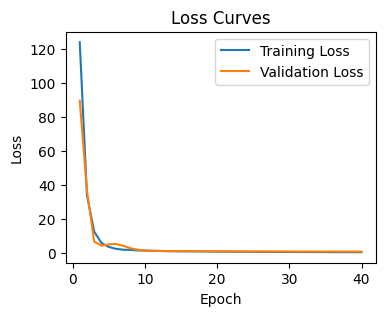

In [ ]:
plt.figure(figsize=(4,3))
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curves")
plt.legend()
plt.show()

## test
(Here we compare the prediction(red box) with the ground truth(blue box) of waldo positions across all the images with labels used either as training dataset or validation dataset.)

/tmp/ipykernel_3476241/2334125735.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  detector.load_state_dict(torch.load("waldo_detector.pth", map_location=device))


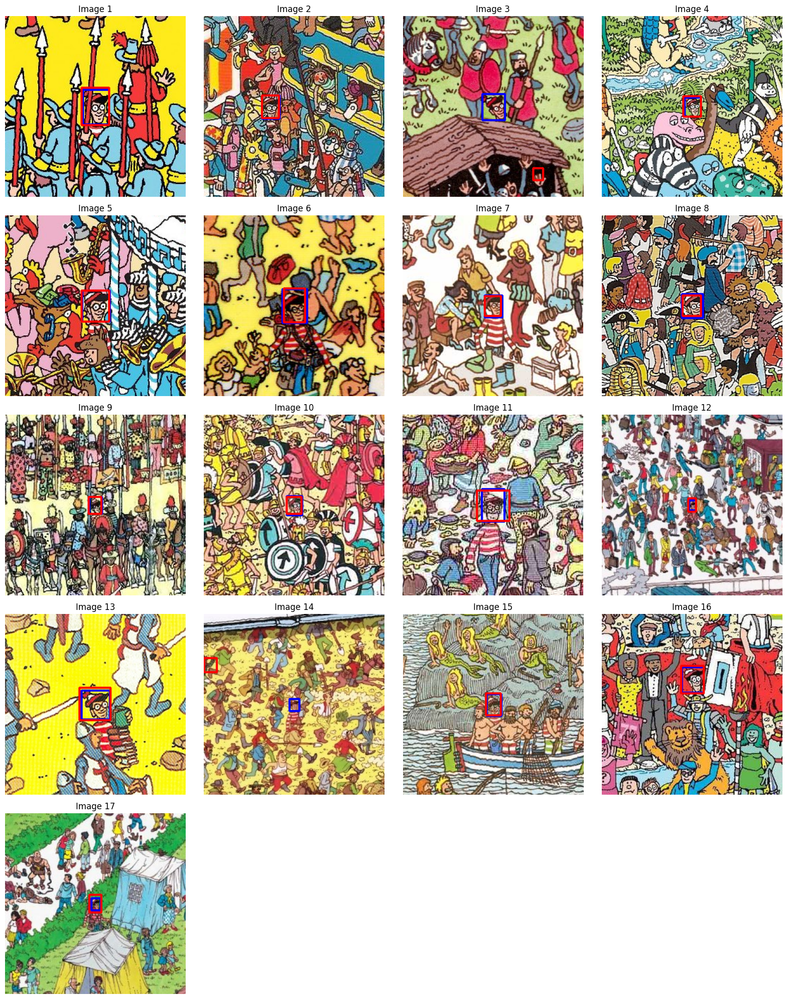

In [ ]:
# Configure folder paths (modify according to your setup)
img_dir = "/home/fangxy/CU/waldo/wheres-waldo/Hey-Waldo/original-images/train"
xml_dir = "/home/fangxy/CU/waldo/TheresWaldo/imgs/bnd_box"

# Get all image files (assume filenames are numbers, e.g., 1.jpg, 2.jpg, …)
img_files = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg','.png','.jpeg'))],
                   key=lambda x: int(os.path.splitext(x)[0]))

# Load the detection model (grid_size must be consistent with training; here we use (32,32))
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")

detector = SimpleDetector(in_channels=3, grid_size=(32,32), num_outputs=5).to(device)
detector.load_state_dict(torch.load("waldo_detector.pth", map_location=device))
detector.eval()

# Store all visualization results
result_imgs = []

# Iterate over all images
for img_name in img_files:
    img_path = os.path.join(img_dir, img_name)
    xml_path = os.path.join(xml_dir, os.path.splitext(img_name)[0] + ".xml")

    # Read the original image and convert to RGB
    img = cv2.imread(img_path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W, _ = img.shape

    # Parse XML to get the list of ground truth bounding boxes; assume at least one target exists
    boxes = parse_xml(xml_path)
    if len(boxes) == 0:
        # Skip images with no target (or handle negative samples as needed)
        continue

    # Save the original ground truth boxes (blue) without coordinate update
    gt_boxes_orig = []
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        gt_boxes_orig.append((xmin, ymin, xmax - xmin, ymax - ymin))

    # Take the first target box and compute the target center
    xmin, ymin, xmax, ymax = boxes[0]
    center_x = (xmin + xmax) // 2
    center_y = (ymin + ymax) // 2

    # Define patch size: 256×256
    patch_w, patch_h = 256, 256
    half_w, half_h = patch_w // 2, patch_h // 2

    # Calculate the top-left corner of the crop region, ensuring it lies within the image
    crop_x = center_x - half_w
    crop_y = center_y - half_h
    if crop_x < 0:
        crop_x = 0
    if crop_y < 0:
        crop_y = 0
    if crop_x + patch_w > W:
        crop_x = W - patch_w
    if crop_y + patch_h > H:
        crop_y = H - patch_h

    # Crop the region that contains Waldo
    crop_patch = img[crop_y:crop_y+patch_h, crop_x:crop_x+patch_w]

    # Update ground truth boxes: convert coordinates to those relative to the crop_patch (for target tensor generation)
    gt_boxes_xywh = []
    for box in boxes:
        new_box = [box[0] - crop_x, box[1] - crop_y, box[2] - crop_x, box[3] - crop_y]
        new_box[0] = max(new_box[0], 0)
        new_box[1] = max(new_box[1], 0)
        new_box[2] = min(new_box[2], patch_w)
        new_box[3] = min(new_box[3], patch_h)
        gt_boxes_xywh.append((new_box[0], new_box[1], new_box[2] - new_box[0], new_box[3] - new_box[1]))

    # Generate the target tensor (here, target_size is the crop_patch size: 256×256)
    target_np = create_target_tensor(target_size=(256,256), boxes=boxes, grid_size=(32,32), orig_size=(256,256))

    # Before inference, normalize crop_patch and convert to tensor
    patch = crop_patch.astype(np.float32) / 255.0
    patch_tensor = torch.from_numpy(np.transpose(patch, (2,0,1))).unsqueeze(0).to(device)

    with torch.no_grad():
        pred = detector(patch_tensor)  # Output shape: [1,5,32,32]

    # Decode the target tensor to obtain the grid-based ground truth box (green)
    def decode_target(target, target_size, grid_size=(32,32)):
        grid_W, grid_H = grid_size
        cell_w = target_size[0] / grid_W
        cell_h = target_size[1] / grid_H
        idx = np.where(target[:,:,0] == 1.0)
        if len(idx[0]) == 0:
            return None
        cell_y = idx[0][0]
        cell_x = idx[1][0]
        local_cx, local_cy, local_w, local_h = target[cell_y, cell_x, 1:]
        box_cx = cell_x * cell_w + local_cx * cell_w
        box_cy = cell_y * cell_h + local_cy * cell_h
        box_w = local_w * target_size[0]
        box_h = local_h * target_size[1]
        x = int(box_cx - box_w/2)
        y = int(box_cy - box_h/2)
        return (x, y, int(box_w), int(box_h))

    decoded_gt_box = decode_target(target_np, target_size=(256,256), grid_size=(32,32))

    # Decode the prediction result
    pred_np = pred.cpu().numpy()            # [1,5,32,32]
    pred_np = np.transpose(pred_np, (0,2,3,1)) # [1,32,32,5]
    def decode_predictions(pred, target_size=(256,256), grid_size=(32,32)):
        grid_W, grid_H = grid_size
        cell_w = target_size[0] / grid_W
        cell_h = target_size[1] / grid_H
        obj_probs = pred[:,:,0]
        idx = np.unravel_index(np.argmax(obj_probs), (grid_H, grid_W))
        cell_y, cell_x = idx
        conf = obj_probs[cell_y, cell_x]
        cx = pred[cell_y, cell_x, 1]
        cy = pred[cell_y, cell_x, 2]
        w = pred[cell_y, cell_x, 3]
        h = pred[cell_y, cell_x, 4]
        box_cx = cell_x * cell_w + cx * cell_w
        box_cy = cell_y * cell_h + cy * cell_h
        box_w = w * target_size[0]
        box_h = h * target_size[1]
        x = int(box_cx - box_w/2)
        y = int(box_cy - box_h/2)
        return (x, y, int(box_w), int(box_h), conf)

    decoded_pred_box = decode_predictions(pred_np[0], target_size=(256,256), grid_size=(32,32))

    # Draw boxes on the crop_patch:
    img_result = crop_patch.copy().astype(np.uint8)
    # Draw the grid-based ground truth box (green)
    if decoded_gt_box is not None:
        x_gt, y_gt, w_gt, h_gt = decoded_gt_box
        cv2.rectangle(img_result, (x_gt, y_gt), (x_gt+w_gt, y_gt+h_gt), (0,255,0), 2)
    # Draw the original XML ground truth boxes (blue)
    for (xmin, ymin, w, h) in gt_boxes_xywh:
        cv2.rectangle(img_result, (xmin, ymin), (xmin+w, ymin+h), (0,0,255), 2)
    # Draw the predicted box (red)
    if decoded_pred_box is not None:
        x_pd, y_pd, w_pd, h_pd, conf = decoded_pred_box
        cv2.rectangle(img_result, (x_pd, y_pd), (x_pd+w_pd, y_pd+h_pd), (255,0,0), 2)

    result_imgs.append(img_result)

# Arrange and display all results (e.g., 4 columns)
num_imgs = len(result_imgs)
cols = 4
rows = (num_imgs + cols - 1) // cols
plt.figure(figsize=(cols*4, rows*4))
for i, img in enumerate(result_imgs):
    plt.subplot(rows, cols, i+1)
    plt.imshow(img)
    plt.title(f"Image {i+1}")
    plt.axis("off")
plt.tight_layout()
plt.show()


## test
(Then we visualize the model prediction(red box) of waldo positions using Hey-Waldo/256/waldo as test data. These data images contains waldo but are different from those we used as training datasets.)

/tmp/ipykernel_3476241/2725378960.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  detector.load_state_dict(torch.load("waldo_detector.pth", map_location=device))


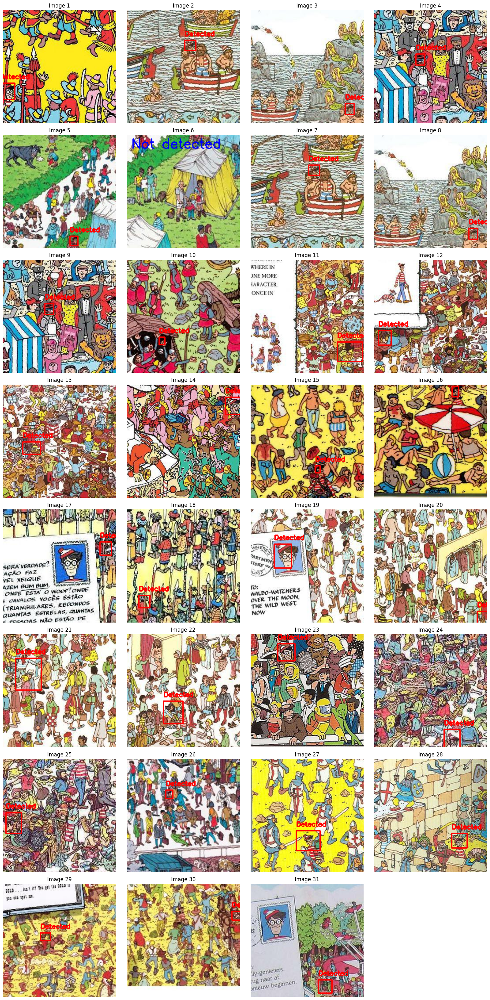

In [ ]:
img_dir = "/home/fangxy/CU/waldo/wheres-waldo/Hey-Waldo/256/waldo"

# Get all image files (assuming filenames are numbers, e.g., 1.jpg, 2.jpg, …)
img_files = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg','.png','.jpeg'))],
                   key=lambda x: int(os.path.splitext(x)[0]))

# Load the detection model (grid_size must match training; here we use (32,32))
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")
detector = SimpleDetector(in_channels=3, grid_size=(32,32), num_outputs=5).to(device)
detector.load_state_dict(torch.load("waldo_detector.pth", map_location=device))
detector.eval()

# Store all visualization results
result_imgs = []

# Function to decode predictions
def decode_predictions(pred, target_size=(256,256), grid_size=(32,32)):
    grid_W, grid_H = grid_size
    cell_w = target_size[0] / grid_W
    cell_h = target_size[1] / grid_H
    obj_probs = pred[:, :, 0]
    idx = np.unravel_index(np.argmax(obj_probs), (grid_H, grid_W))
    cell_y, cell_x = idx
    conf = obj_probs[cell_y, cell_x]
    cx = pred[cell_y, cell_x, 1]
    cy = pred[cell_y, cell_x, 2]
    w = pred[cell_y, cell_x, 3]
    h = pred[cell_y, cell_x, 4]
    box_cx = cell_x * cell_w + cx * cell_w
    box_cy = cell_y * cell_h + cy * cell_h
    box_w = w * target_size[0]
    box_h = h * target_size[1]
    x = int(box_cx - box_w/2)
    y = int(box_cy - box_h/2)
    return (x, y, int(box_w), int(box_h), conf)

# Iterate over a subset of images for visualization (e.g., first 15 images)
for img_name in img_files:
    img_path = os.path.join(img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W, _ = img.shape

    # Model inference: normalize and convert to tensor
    patch = img.astype(np.float32) / 255.0
    patch_tensor = torch.from_numpy(np.transpose(patch, (2, 0, 1))).unsqueeze(0).to(device)

    with torch.no_grad():
        pred = detector(patch_tensor)  # Output shape: [1, 5, 32, 32]

    # Decode prediction result
    pred_np = pred.cpu().numpy()            # [1, 5, 32, 32]
    pred_np = np.transpose(pred_np, (0, 2, 3, 1))  # [1, 32, 32, 5]
    decoded_pred_box = decode_predictions(pred_np[0], target_size=(256,256), grid_size=(32,32))

    # Draw the predicted bounding box on the original image (red)
    img_result = img.copy().astype(np.uint8)
    # Check confidence threshold (e.g., 0.5)
    if decoded_pred_box is not None:
        x_pd, y_pd, w_pd, h_pd, conf = decoded_pred_box
        if conf > 0.1:
            cv2.rectangle(img_result, (x_pd, y_pd), (x_pd + w_pd, y_pd + h_pd), (255, 0, 0), 2)
            cv2.putText(img_result, f"Detected", (x_pd, y_pd-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)
        else:
            cv2.putText(img_result, "Not detected", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
    else:
        cv2.putText(img_result, "Not detected", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)

    result_imgs.append(img_result)

# Arrange and display all results (e.g., 4 columns)
num_imgs = len(result_imgs)
cols = 4
rows = (num_imgs + cols - 1) // cols
plt.figure(figsize=(cols * 4, rows * 4))
for i, img in enumerate(result_imgs):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(f"Image {i+1}")
    plt.axis("off")
plt.tight_layout()
plt.show()